In [2]:
from project import *

In [2]:
df_clean.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,days_since_first
0,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,3,7,1180,0.0,1955,0.0,47.5112,-122.257,1340,5650,164
1,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,47.7210,-122.319,1690,7639,221
2,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,0.0,47.7379,-122.233,2720,8062,299
3,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,47.5208,-122.393,1360,5000,221
4,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,47.6168,-122.045,1800,7503,292


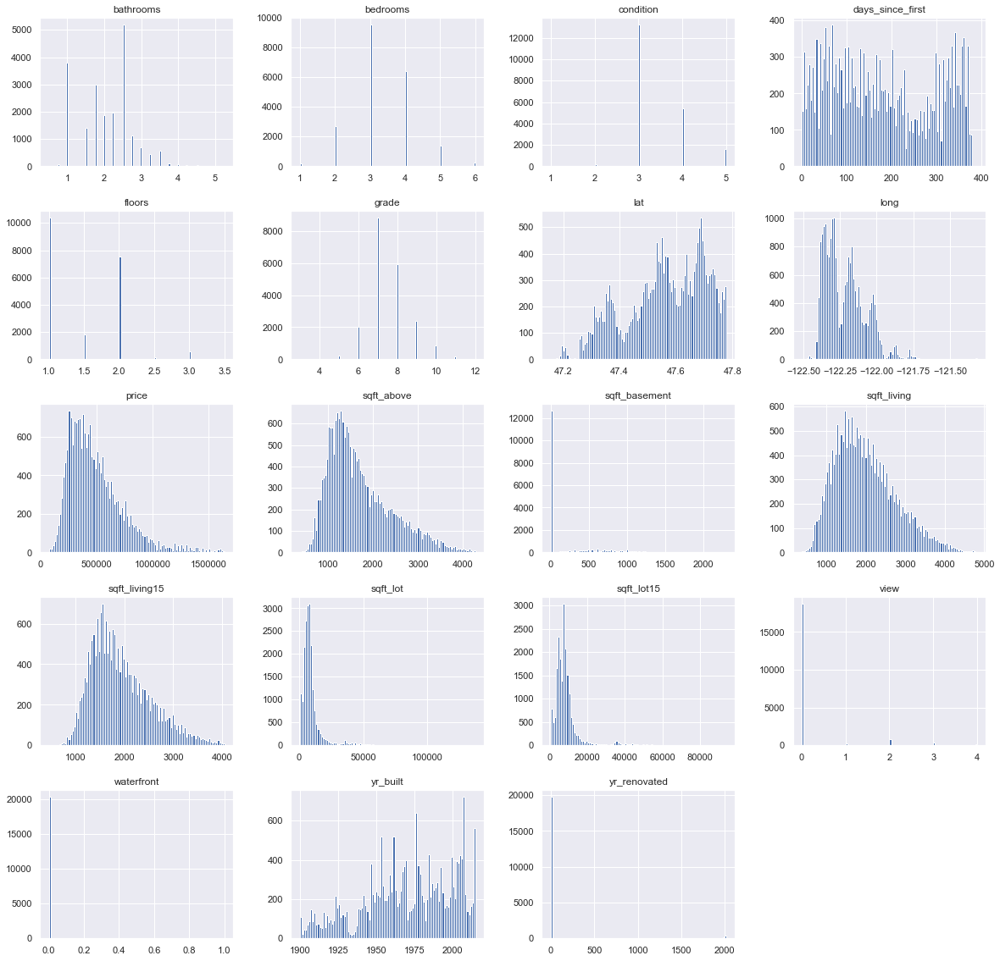

In [3]:
hist(df_clean)

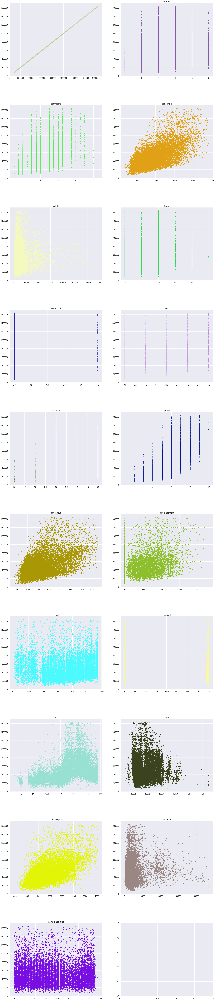

In [4]:
scatter(df_clean, 'price')

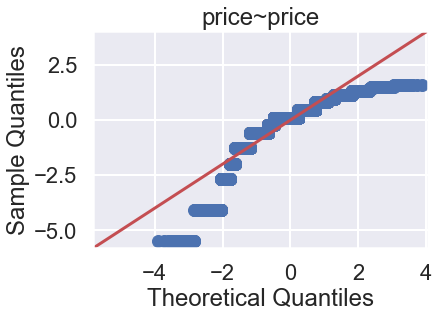

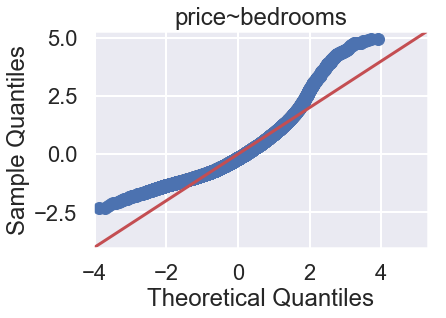

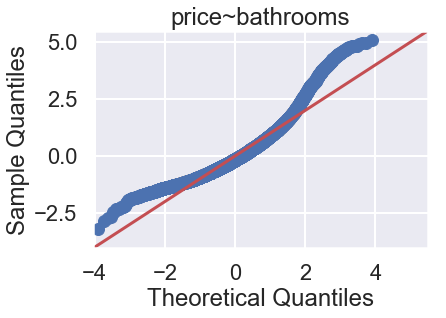

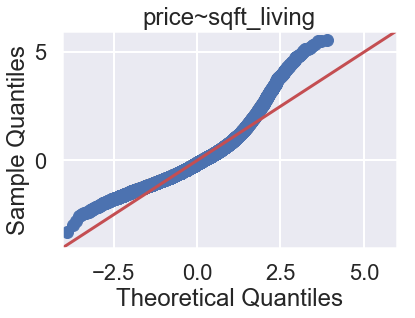

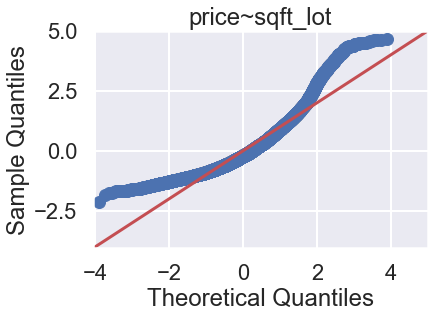

...

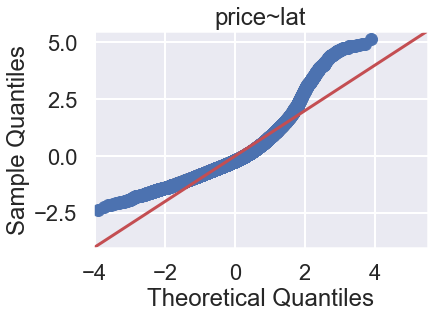

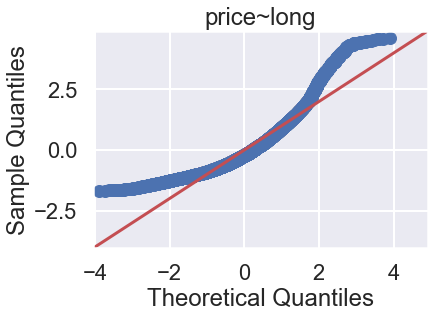

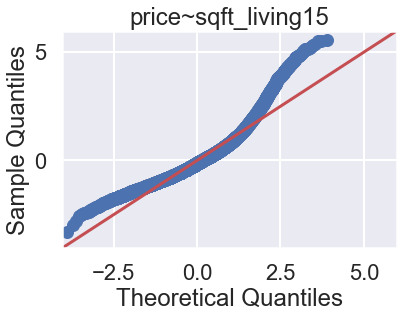

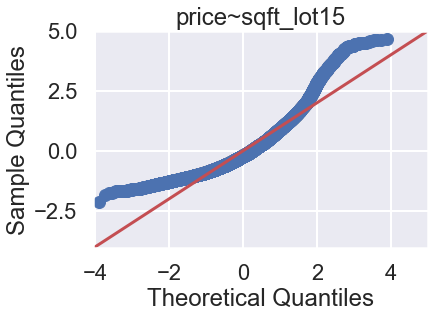

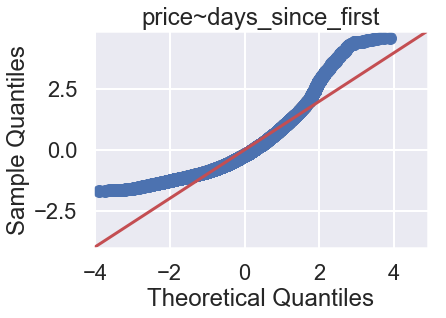

In [5]:
qqplots(df_clean, clean_formula, 'price')

Clearly, our data doesn't look the best. Based on looking at the data and seeing what had a large range in values, I log transformed price and all sqft measurements except sqft basement. 

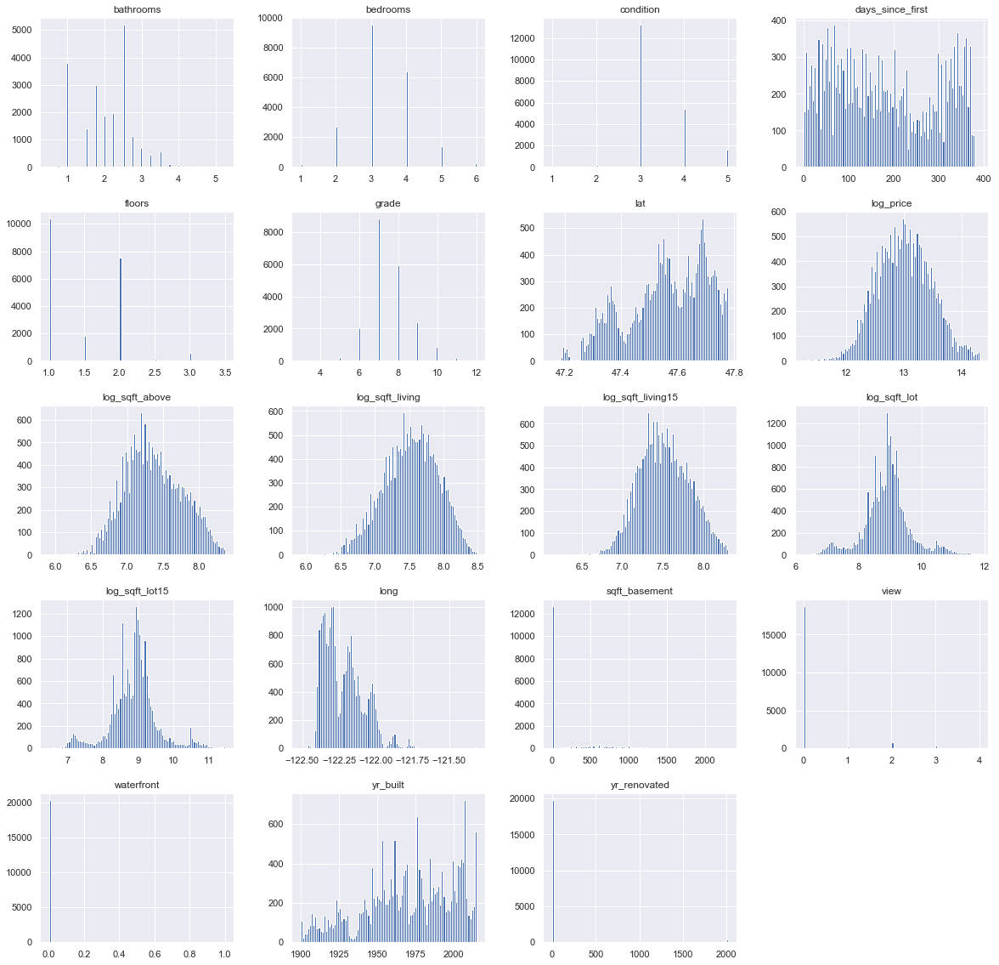

In [2]:
hist(clean_log)

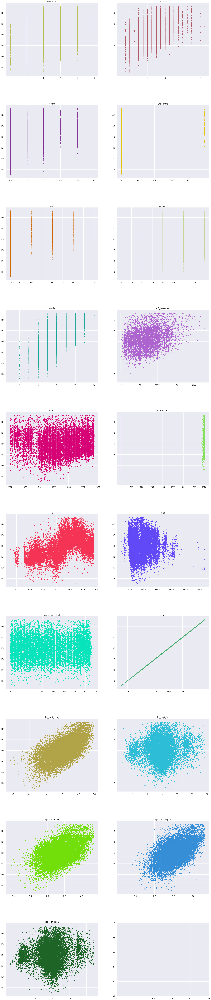

In [3]:
scatter(clean_log, 'log_price')

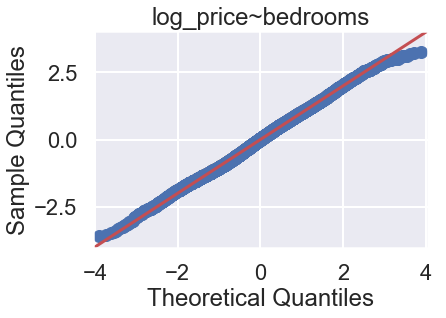

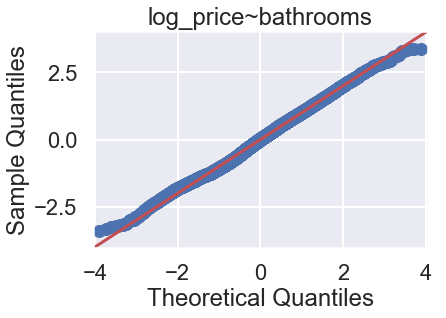

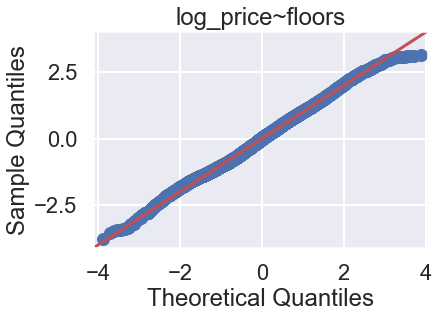

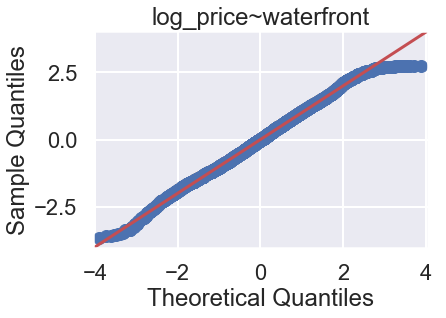

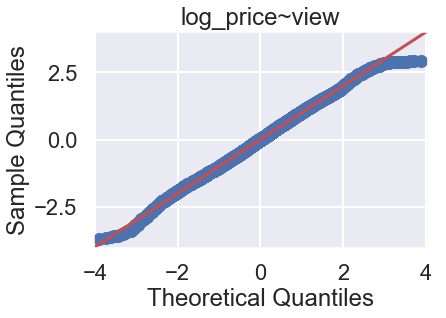

...

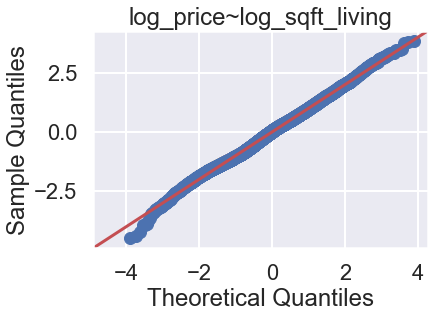

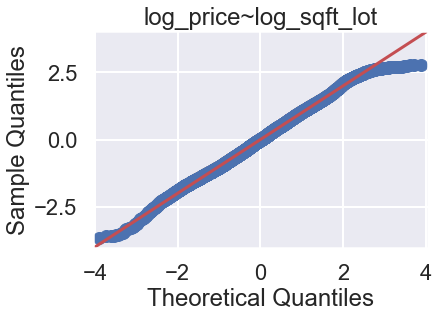

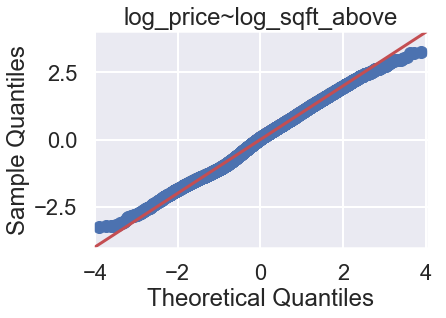

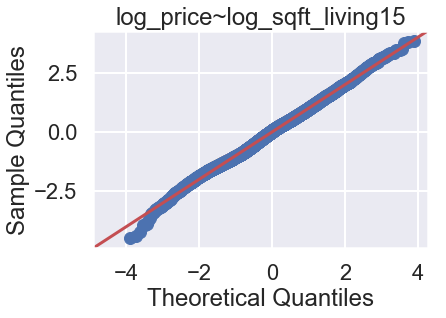

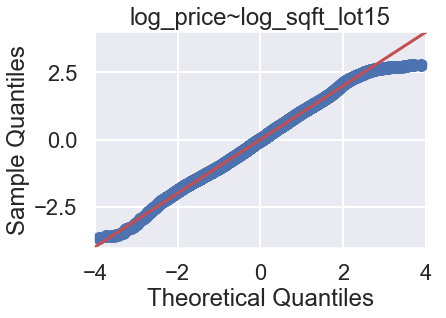

In [4]:
qqplots(clean_log, log_formula, 'log_price')

Great, that looks a lot better. Now let's look at our correlations to see what we want to investigate for our model and what is too highly correlated and needs to be dropped. 

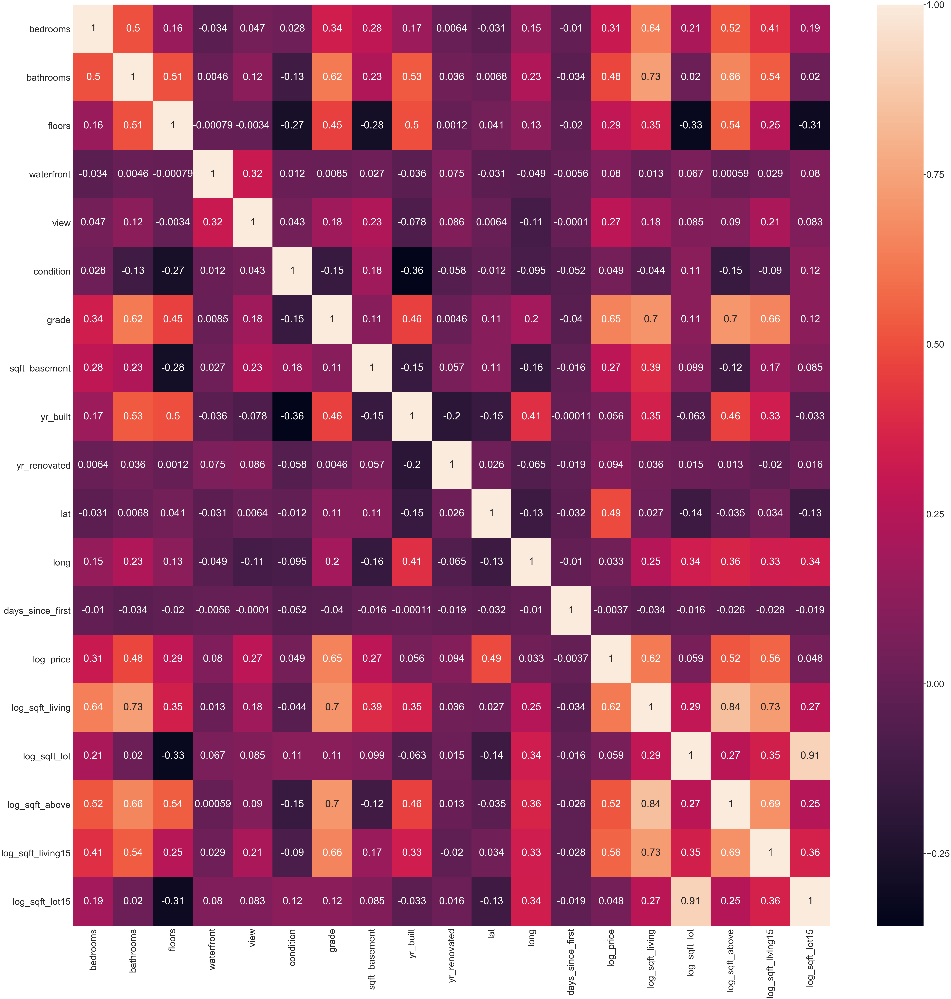

In [5]:
correlationhm(clean_log)

In [6]:
correlationcheck(clean_log)

,bedrooms,bathrooms,floors,waterfront,view,condition,grade,sqft_basement,yr_built,yr_renovated,lat,long,days_since_first,log_price,log_sqft_living,log_sqft_lot,log_sqft_above,log_sqft_living15,log_sqft_lot15
bedrooms,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
floors,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
grade,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
sqft_basement,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
yr_built,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
yr_renovated,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False


Ok so from these correlations, we can see that our most interesting correlations to price will be: bedrooms, bathroom, floor, view, grade, sqft_basement, lat, log_sqft_living, log_sqft_living_15. Let's take a look at our model so far.

In [5]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.692
Model:                            OLS   Adj. R-squared:                  0.692
Method:                 Least Squares   F-statistic:                     5096.
Date:                Fri, 21 Jun 2019   Prob (F-statistic):               0.00
Time:                        09:51:20   Log-Likelihood:                -1796.7
No. Observations:               20424   AIC:                             3613.
Df Residuals:                   20414   BIC:                             3693.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept           -63.3957      0.655    -96.829      0.000     -64.679     -62.112
bedrooms             -0.0126      0.003     -4.389      0.000      -0.018      -0.007
bathrooms            -0.0022      0.004     -0.518      0.604      -0.011       0.006
floors                0.0245      0.005      5.167      0.000       0.015       0.034
view                  0.0933      0.003     32.691      0.000       0.088       0.099
grade                 0.1319      0.003     46.535      0.000       0.126       0.138
sqft_basement      5.408e-05   6.02e-06      8.979      0.000    4.23e-05    6.59e-05
lat                   1.5030      0.014    109.959      0.000       1.476       1.530
log_sqft_living       0.3425      0.011     31.881      0.000       0.321       0.364
log_sqft_living15     0.1755      0.009     18.649      0.000       0.157       0.194
==============================================================================
Omnibus:                      242.228   Durbin-Watson:                   1.997
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              360.429
Skew:                           0.132   Prob(JB):                     5.42e-79
Kurtosis:                       3.595   Cond. No.                     1.75e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.75e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Not bad, but we can definitely improve this. Let's run some feature selection tests on all of our independent variables (except for the ones that correlations > 0.75) and see what top 5 variables work best for our model. 

In [5]:
dependent = 'log_price'
predictors = "+".join(feature_selection.columns)
formula = dependent + "~" + predictors
feature = ols(formula= formula, data=model_df).fit()
feature.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.700
Method:                 Least Squares   F-statistic:                     6801.
Date:                Fri, 21 Jun 2019   Prob (F-statistic):               0.00
Time:                        10:50:00   Log-Likelihood:                -1532.6
No. Observations:               20424   AIC:                             3081.
Df Residuals:                   20416   BIC:                             3145.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept           -97.8377      1.783    -54.868      0.000    -101.333     -94.343
waterfront            0.6085      0.030     20.094      0.000       0.549       0.668
condition             0.0897      0.003     31.376      0.000       0.084       0.095
grade                 0.1474      0.003     56.615      0.000       0.142       0.152
lat                   1.4876      0.013    110.751      0.000       1.461       1.514
long                 -0.2801      0.014    -19.587      0.000      -0.308      -0.252
log_sqft_living       0.3502      0.007     46.773      0.000       0.336       0.365
log_sqft_living15     0.2389      0.009     25.831      0.000       0.221       0.257
==============================================================================
Omnibus:                      179.418   Durbin-Watson:                   1.997
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              248.922
Skew:                           0.116   Prob(JB):                     8.86e-55
Kurtosis:                       3.488   Cond. No.                     1.29e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.29e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

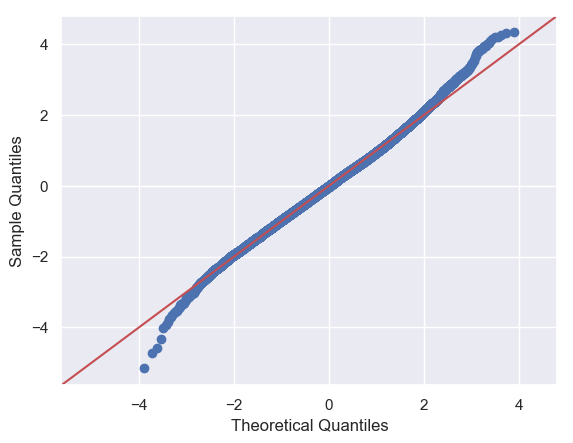

In [4]:
featureqq

Ok, our qq plot looks ok - we can see that waterfront, condition, grade, location, and amount of square footage (both in the home and with the 15 nearest neighbors) greatly influences the trend in price in King County and that this is reasonably normally distributed. But now it's important that we look to see whether our model could be applied to more data. To do this we will use train test split in which we can separate our data to find the mean squared error, which will show us the difference in residuals between our training set and our test set. 

In [2]:
trainmse

'train MSE: 0.06750868848299811'

In [3]:
testmse

'test MSE: 0.07013410509407127'

As we can see, our train and test MSEs are very close, which means that we have not overfit our model!

# Time for some questions!

### How does location impact our price?
Let's start with thinking about how our location impacts our pricing. We can see from our model that latitude and longitude significantly impact our pricing, as well as whether the house is on the water and how much squarefeet of living space people's neighbors have. We can visualize this with the following heatmap. 

### How may squarefeet of living space impact our price?
So even though we can see that our more expensive houses exist in more densely populated areas, we can see that in more rural areas, we have some very expensive houses. This may be due to more space for house sizes. 

Special thanks to Michael Cunha from Alcid Analytics for this awesome feature (https://alcidanalytics.com/p/geographic-heatmap-in-python).

In [3]:
price_map

In our dataset, we had a lot of duplicated IDs. This seemed to point to the fact that the houses were put back on sale. 

In [167]:
df_duplicated1.corr()

,id,price,days_since_first
id,1.000000,0.234019,-0.020871
price,0.234019,1.000000,-0.017448
days_since_first,-0.020871,-0.017448,1.000000


In [166]:
df_duplicated2.corr()

,id,price,days_since_first
id,1.000000,0.202521,-0.136445
price,0.202521,1.000000,-0.129019
days_since_first,-0.136445,-0.129019,1.000000


In [162]:
df_duplicated1.price.mean()

458483.76744186046

In [163]:
df_duplicated1.days_since_first.mean()

298.3546511627907

In [161]:
df_duplicated2.price.mean()

319495.97093023255

In [165]:
df_duplicated2.days_since_first.mean()

116.63953488372093